# Final Notebook- Aneesa Gomez-Cervantes
## Variables Analyzed: Land Surface Temperature and Household Income in Los Angeles

#### Land Surface Temperature Map code done in Collaboration with Pa-Shun Hawkins. 
#### Other Roles- Assembled the story map, completed the maps and wrote paragraphs for- LST Map, Household Income Map/Moran Scatterplot, Regression Scatterplot: Total Household Income vs Top 20 LST LA, and the Interactive Household Income Map
#### Collaborated on discussion/conclusion and google slides

In [34]:
#Impoting libraries 
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from scipy.stats import linregress
import contextily as ctx

In [35]:
# Load CSV file and filter rows for LA
df = pd.read_csv('Data/Heat.csv', dtype={'GEOID': str, 'SHAPE_Length': str, 'SHAPE_Area': str})
california_df = df[df['County'] == 'Los Angeles County']

columns_to_keep = ['GEOID','High_Summer_Mean_LST_F', 'State', 'County', 'SHAPE_Length', 'SHAPE_Area']
df2 = california_df[columns_to_keep]

df2.columns = ['FIPS','High_Summer_Mean_LST_F', 'State', 'County', 'SHAPE_Length', 'SHAPE_Area']

tracts = gpd.read_file('Data/censustract2.zip')[['CT20', 'geometry']]
tracts['FIPS'] = '06037' + tracts['CT20']

tracts_health = tracts.merge(df2, on="FIPS")

# Remove NaN values
tracts_health2 = tracts_health.dropna(subset=['High_Summer_Mean_LST_F'])

## LST Map
### This map is used to in comaprison against each one of our social vulnerability factors. The data where this was collected was the [Heat Health Census Tract](https://gis-for-racialequity.hub.arcgis.com/datasets/7f05981247034b5da1887f14b7ed523b_0/about).
#### This map represents the high summer mean land temperature in LA. To explore the data we used the Heat Health Census Tract. By using this tract we were able to pull data by county, to find their mean land surface temperature. The red is showing the highest land surface temperature and the green is showing the lowest land surface temperature. However, it is important to note that the light green and yellow are still high temperatures that can pose risks to communities. It is clear that that the county's north and central are most affected in LA. However, the places closer to the beach near Santa Monica and Long Beach experience the lowest land surface temperatures. Having mapped the highest land surface temperature, we can now compare our three social vulnerability measures to see if certain factors contribute to a heightened risk of experiencing high surface land temperature.

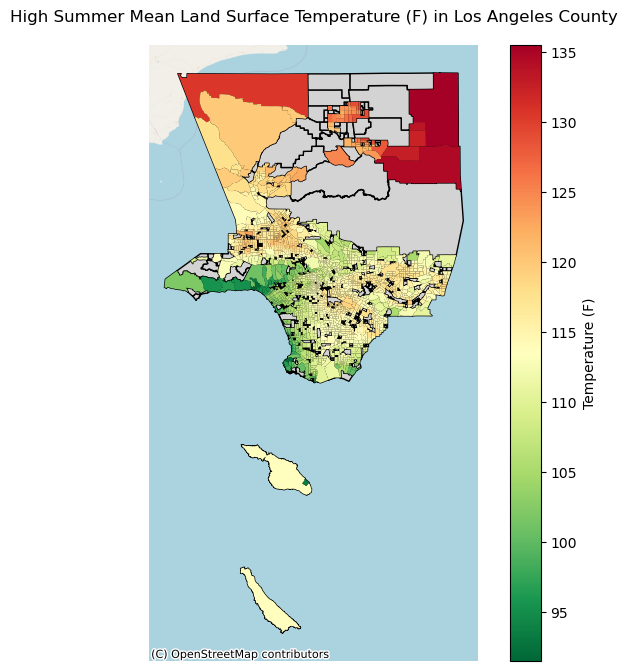

In [36]:
# Plotting the static map with basemap
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

# Plot Census Tract boundaries
tracts.plot(ax=ax1, color='lightgray', edgecolor='black')

# Plot distribution of minorities
tracts_health2.plot(ax=ax1, column='High_Summer_Mean_LST_F', cmap='RdYlGn_r', legend=True, legend_kwds={'label': 'Temperature (F)'})

# Add streets and city names 
ctx.add_basemap(ax1, zoom=11, source=ctx.providers.OpenStreetMap.Mapnik)

# Remove axes on the map
ax1.set_axis_off()

# Set the title
ax1.set_title('High Summer Mean Land Surface Temperature (F) in Los Angeles County')

# Remove ax2 subplot
fig.delaxes(ax2)

# Display the plot
plt.show()




# Household Income Analysis LA
### This data was collected from [Census Data of the U.S.](https://www.census.gov/). The household income of Los Angeles was found through the Census Bureau of the United States. It was filtered down to the county of LA and estimated total household income.
#### Household income plays a pivotal role in shaping the impact of high heat events on communities. Its significance lies in several key characteristics. First, income dictates access to resources such as air conditioning and healthcare, influencing susceptibility to heat-related illnesses. Second, disparities in housing quality contribute to differential heat exposure, with lower-income households often residing in inadequately ventilated or insulated homes. Moreover, the burden of increased energy costs strains household budgets, especially for cooling expenses, forcing difficult trade-offs between comfort and necessities. Lastly, extreme heat events may trigger displacement and migration among economically disadvantaged populations, highlighting the interconnectedness of income, resilience, and climate adaptation strategies. Understanding these characteristics underscores the urgency of addressing socioeconomic disparities in climate resilience efforts to ensure equitable protection for all communities.

In [37]:
#import packages
import geopandas as gpd
import pandas as pd

In [38]:
#import data
censusdata=gpd.read_file('Data/censustract2.zip', crs='epsg:3857')

In [39]:
#import second set of data
hidata=pd.read_csv('Data/income.csv')

In [40]:
#fix projection
censusdata=censusdata.to_crs('epsg:3857')

In [41]:
#columns to keep
columnskeep1 = ['GEO_ID',
                'NAME',
                'S1901_C01_001E',
                 ]
# add it to a new dataframe
dfincome= hidata[columnskeep1]

In [42]:
#renaming
dfincome.columns = ['GEO_ID',
                    'Name',
                 'Estimate Household Income Total' 
                 
]

In [43]:
#returns a list of column names from  dfincome where all values in each column are missing 
dfincome.columns[dfincome.isna().all()].tolist()

[]

In [44]:
#removig unuseful data
dfincome = dfincome.dropna(axis=1,how="all")

In [45]:
#drop first row
dfincome = dfincome.drop(index =0)

In [46]:
#drop second row
dfincome = dfincome.drop(index =1)

In [47]:
#dfincome will have a new column named 'CT20', which contains the last six characters from the 'GEO_ID' column for each row
dfincome['CT20'] =dfincome.GEO_ID.str[-6:]

In [48]:
#new data frame to merge
income_gdf = censusdata.merge(dfincome, on = 'CT20')

In [49]:
#converting to float
income_gdf['Estimate Household Income Total']= income_gdf['Estimate Household Income Total'].astype('float')

In [50]:
# to read and wrangle data
import pandas as pd

# to import data from LA Data portal
from sodapy import Socrata

# to create spatial data
import geopandas as gpd

# for basemaps
import contextily as ctx

# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

# Graphics
import matplotlib.pyplot as plt
import plotly.express as px

In [51]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(income_gdf,k=8)

# Row-standardization
wq.transform = 'r'

In [52]:
# create a new column for the spatial lag
income_gdf['income_lag'] = lps.weights.lag_spatial(wq, income_gdf['Estimate Household Income Total'])

In [53]:
# create a column that calculates the difference between income and lag
income_gdf['income_lag_diff'] = income_gdf['Estimate Household Income Total'] - income_gdf['income_lag']

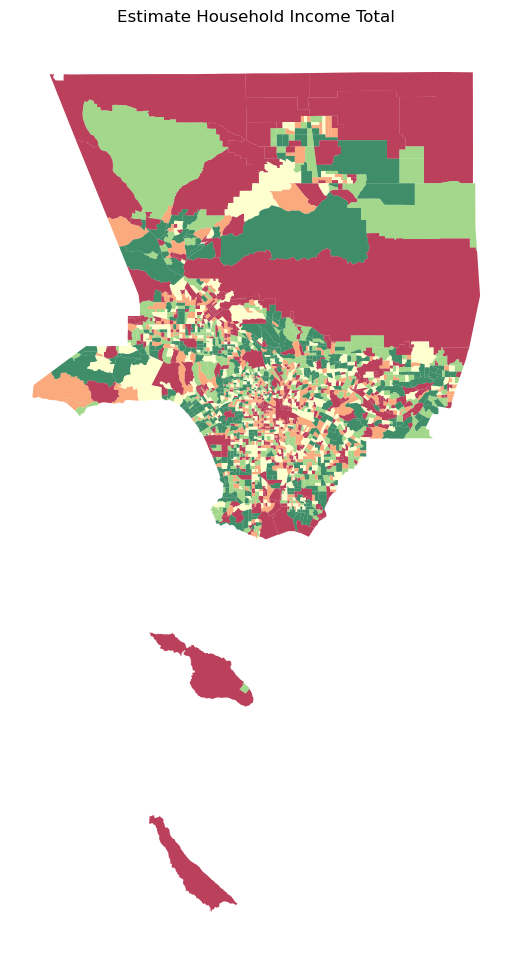

In [54]:
# create the 1x2 subplots
fig, ax = plt.subplots(1, 1, figsize=(20, 12))

# regular count map on the left
income_gdf.plot(ax=ax,  # this assigns the map to the subplot
                column='Estimate Household Income Total', 
                cmap='RdYlGn', 
                scheme='quantiles',
                k=5, 
                edgecolor='white', 
                linewidth=0, 
                alpha=0.75)

ax.axis("off")
ax.set_title("Estimate Household Income Total")
plt.show()




In [55]:
#spatial lag value
y = income_gdf['Estimate Household Income Total']
moran = Moran(y, wq)
moran.I


0.20342073019431428

In [56]:
#p-value
moran.p_sim

0.001

In [57]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

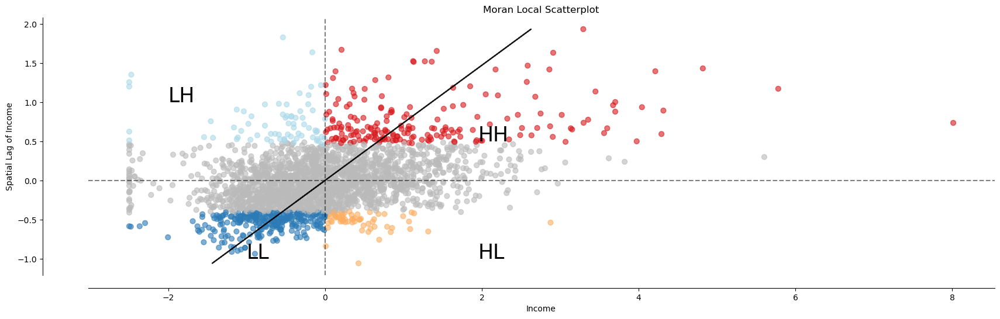

In [58]:
# Plot
fig,ax = plt.subplots(figsize=(20,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Income")
ax.set_ylabel('Spatial Lag of Income')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

#### The chloropleth map above is showing the distribution of household income in LA. It is evident that the majority of Los Angeles low income areas are found in the northern and central parts of LA. This map is useful to see where the clustering of low income households are as it makes it visually easy to identify the most vulnerable communities. The Moran scatterplot provides insights into the spatial distribution of the low income households, highlighting areas of spatial clustering, dispersion, or spatial outliers. In terms of income this is a great visual representation as we can see there is a large gap from the high-high and the low-low of income. This reveals there are large income gaps in LA. In addition, by having the map to the left shown without spatial lag next to the Moran Scatterplot that does show spatial lag we can see if there is enhanced clustering in neighborhoods. This way we can highlight the areas that are similar or dissimilar in terms of income,  allowing us to identify spatial patterns and trends.

In [62]:
# Load CSV file and filter rows for LA
df = pd.read_csv('Data/Heat.csv', dtype={'GEOID': str, 'SHAPE_Length': str, 'SHAPE_Area': str})
california_df = df[df['County'] == 'Los Angeles County']


columns_to_keep = ['GEOID','High_Summer_Mean_LST_F', 'PCT_Pop_Minority','B08201_calc_pctNoVehE', # Define columns to keep
                   'State', 'County', 'SHAPE_Length', 'SHAPE_Area',]


df2 = california_df[columns_to_keep]   # Create a new df w/ subset columns


df2.columns = ['GEOID', 'High Summer Mean LST (F)',  # Rename columns
               'Minorities', 'HHs With No Vehicle Available', 'State', 'County', 'SHAPE_Length', 'SHAPE_Area']

tracts = gpd.read_file('Data/censustract2.zip')[['CT20', 'geometry']]   # Creating a GeoDataFrame from GeoJSON 

tracts['GEOID'] = '06' + '037' + tracts['CT20']
tracts_health = tracts.merge(df2[df2['County'] == 'Los Angeles County'], on="GEOID")  # Create 'FIPS' column and combine it with race data

In [64]:
tracts_health.head()

,CT20,geometry,GEOID,High Summer Mean LST (F),Minorities,HHs With No Vehicle Available,State,County,SHAPE_Length,SHAPE_Area
0,101110,"POLYGON ((6471651.068 1918306.964, 6471940.821...",06037101110,114.308945,38.9,6.2,California,Los Angeles County,0.047170387452123,0.000111816773702876
1,101122,"POLYGON ((6477840.844 1917081.399, 6477828.620...",06037101122,110.393158,15.4,0.6,California,Los Angeles County,0.0962371712544653,0.000258821086585712
2,101220,"POLYGON ((6477611.571 1915577.225, 6477591.852...",06037101220,113.156300,51.1,8.6,California,Los Angeles County,0.0384994448665562,6.83997458462203e-05
3,101300,"POLYGON ((6481507.271 1914333.735, 6481496.003...",06037101300,110.677368,19.5,3.4,California,Los Angeles County,0.0858455710614444,0.000252614528733926
4,101400,"POLYGON ((6471180.325 1915672.127, 6471641.672...",06037101400,113.693161,34.3,7.7,California,Los Angeles County,0.133831492115244,0.000617501084656308


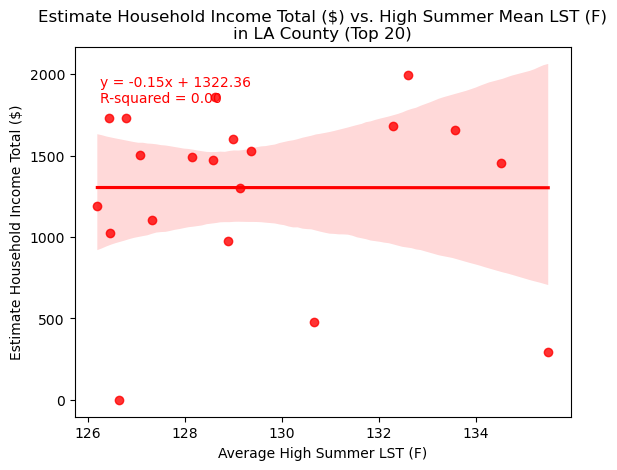

In [69]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import linregress
# Assuming 'CT20' is the common column, merge the DataFrames
merged_data = tracts_health.merge(income_gdf, left_on='CT20', right_on='CT20')


# Sort the merged data by 'High_Summer_Mean_LST_F' and select top 20
top_20_data = merged_data.sort_values(by='High Summer Mean LST (F)', ascending=False).head(20)

# Plotting scatter plot with regression line using seaborn 
sns.regplot(x='High Summer Mean LST (F)', y='Estimate Household Income Total', data=top_20_data, color='red')

# Calculate regression line parameters
slope, intercept, r_value, p_value, std_err = linregress(top_20_data['High Summer Mean LST (F)'], top_20_data['Estimate Household Income Total'])

# Add regression line equation to the plot 
plt.annotate(f'y = {slope:.2f}x + {intercept:.2f}\nR-squared = {r_value**2:.2f}', 
             xy=(0.05, 0.85), xycoords='axes fraction', fontsize=10, color='red')

# Set plot labels and title
plt.xlabel('Average High Summer LST (F)')
plt.ylabel('Estimate Household Income Total ($)')
plt.title('Estimate Household Income Total ($) vs. High Summer Mean LST (F)\nin LA County (Top 20)')

# Show the plot
plt.show()



#### The regression scatterplot provides intriguing insights when contrasted with the initial choropleth observations. Upon thorough analysis, it becomes evident that the absence of correlation stems from the inadequate representation of average high summer Land Surface Temperature (LST) data in low-income areas. This lack of correlation arises not from a genuine absence of relationship, but rather from the deficiency in data collection. This is crucial to our analysis as it  sheds light on areas where comprehensive data collection is lacking. 

In [70]:
# a quick interactive version: geopandas .explore function 

income_gdf.explore(
        column='Estimate Household Income Total', # this defines the field to "choropleth"
        legend=True,
        cmap='RdYlGn', 
        scheme='naturalbreaks',
        style_kwds={
            'weight':0.5,
            'color':'black',
            'opacity':0.5
        },
        tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
        attr='Tiles &copy; Esri &mdash; Source: Esri, i-cubed, USDA, USGS, AEX, GeoEye, Getmapping, Aerogrid, IGN, IGP, UPR-EGP, and the GIS User Community'
        )

#import folium in order to save the map for story map purposes and to create a link
import folium

# Create choropleth map for 'income_gdf' GeoDataFrame
m = income_gdf.explore(
    column='Estimate Household Income Total',  # Defines the field to "choropleth"
    legend=True,
    cmap='RdYlGn',
    scheme='naturalbreaks',
    style_kwds={
        'weight': 0.5,
        'color': 'black',
        'opacity': 0.5
    },
    tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
    attr='Tiles &copy; Esri &mdash; Source: Esri, i-cubed, USDA, USGS, AEX, GeoEye, Getmapping, Aerogrid, IGN, IGP, UPR-EGP, and the GIS User Community'
)

# Add alternative tiles to the map using folium
folium.TileLayer("CartoDB positron", show=False).add_to(m)

# Add layer control to the map using folium
folium.LayerControl().add_to(m)

# Show the map
m

#### The correspondence between the predominantly gray areas on the Land Surface Temperature (LST) map and the red regions on the income map reveals a critical discrepancy affecting the representativeness of our data. This disparity underscores the necessity for obtaining data from the gray areas to find a genuine correlation. For future exploration,  prioritization of collecting data in the gray areas would be made. Given that the gray sections on the LST map predominantly coincide with low-income areas, visually depicting the correlation between low income and potentially high LST could serve as evidence for policymakers. This visualizations can effectively advocate for targeted interventions aimed at safeguarding vulnerable communities from the adverse impacts of extreme heat.

# Conclusion

#### Our analysis reveals a crucial gap in data representation, particularly in low-income areas, which impedes our ability to fully understand the relationship between  low-income areas and LST. Addressing this deficiency in data collection is paramount for accurately assessing the impact of high LST on different socioeconomic classes. Moving forward, prioritizing data collection efforts in these underserved areas will be essential for informing targeted interventions and policy decisions aimed at mitigating the adverse effects of extreme heat on vulnerable communities. Visual representations of the correlation between low income and potentially high LST can serve as powerful advocacy tools for policymakers, emphasizing the importance of equitable approaches to environmental justice.
